# Gravitational waves from binary systems

The strain in the quadrupole approximation is given by the second time derivative of the quadrupole mass moment. $\bar{h}_{\mu\nu} =  h_{\mu\nu} - \tfrac{1}{2}\eta_{\mu\nu}h$ is the inverse trace.

$$\bar{h}^{ij}(t,r) = \frac{2G}{c^4 r} \frac{d^2}{dt^2}q^{ij}(t-\tfrac{r}{c})$$

In the transverse traceless gauge (TT gauge) $\bar{h}_{\mu\nu} =  h_{\mu\nu}$.

$$h^{TT,ij}(t,r) = \frac{2G}{c^4 r} \frac{d^2}{dt^2}q^{TT,ij}(t-\tfrac{r}{c})$$

The TT projector is defined by:

$$P_{jkmn} = P_{jm}P_{kn} - \tfrac{1}{2}P_{jk}P_{mn}$$

where $P_{jk}=\delta_{jk}-n_jn_k$ is the transverse projector.

Luminosity is defined by:

$$\frac{dE_{GW}}{dtdS}=\frac{c^3}{32\pi G}\langle\sum_{ij}\left( \frac{dh_{ij}}{dt}\right)^2 \rangle$$

from which:

$$L_{GW} = \frac{G}{5c^5}\langle\sum_{ij}\dddot{Q}_{ij} \dddot{Q}_{ij}\rangle$$

where $\dddot{Q}_{ij}$ is the triple time derivative of the TT gauge quadrupole mass moment.



**Binary initialization**

In an elliptical binary separation $r$ is given by:

$$r=a\frac{1-e^2}{1-e\cos{\phi}}$$

where $a$ is the semimajor axis. Energy is:

$$E=-\frac{GM\mu}{2a}$$ 

and the angular momentum is:

$$L = \mu\sqrt{GMa(1-e^2)}$$

In order to initialize the velocity for a binary system with given $a$ and eccentricity $e$ we can't just plug $r$ in the kepler formula $v=\sqrt{GM/a}$. This value is an average value over all orbit. Initial velocity must be set at some particolar point(i.e. periastron or apoastron) where $\mathbf{r}$ and $\mathbf{v}$ are perpendicular and it is possible to extract the value directly from $L$. 


In [1]:
import numpy as np
from scipy.interpolate import interp1d
from scipy.misc import derivative
from scipy.signal import find_peaks
from scipy.signal import hilbert
from scipy.signal import savgol_filter
from scipy.integrate import quad
from scipy.signal import fftconvolve
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
from matplotlib.animation import FuncAnimation
from tqdm import tqdm
from IPython.display import HTML 
import warnings
warnings.filterwarnings('ignore')

In [6]:
from GW_functions import double_dot_qmm, triple_dot_qmm
from GW_functions import construct_transverse_basis, rotate_to_new_frame, TT_projector, polarized_strains
from GW_functions import step
from plot import plot, animation





Waveform: I needed to uniformize dt!

n_cycle. Do I need the kepler frequency or the GW frequency?

**3^rd order Hermite algorithm: error scales as dt^3**


$$G = 1$$
$$\textbf{f}_i=\sum_{j\neq i} \frac{m_im_j}{|\textbf{r}_{ij}|^3}\textbf{r}_{ij}$$

$$\textbf{x}_{i+1}=\textbf{x}_i+\textbf{v}_idt+\frac{1}{2}\textbf{a}_idt^2+\frac{1}{3!}\textbf{J}_idt^3$$

$$\textbf{v}_{i+1}=\textbf{v}_i+\textbf{a}_idt+\frac{1}{2}\textbf{J}_idt^2$$

The jerk can be evaluated knowing the position and the velocity vector only: 

$$\textbf{a}_i=\sum_{j\neq i} \frac{m_j}{|\textbf{r}_{ij}|^3}\textbf{r}_{ij}$$
$$\textbf{J}_i=\frac{d}{dt}\textbf{a}_i=\sum_{j\neq i}m_j\left( \frac{\textbf{v}_{ij}}{|\textbf{r}_{ij}|^3}-3\frac{\textbf{r}_{ij}}{|\textbf{r}_{ij}|^4}\frac{d}{dt}|\textbf{r}_{ij}|\right)$$

but $|\textbf{r}_{ij}|=\sqrt{\textbf{r}_{ij}\cdot \textbf{r}_{ij}}$ thus: 

$$\textbf{J}_i=\sum_{j\neq i}\frac{m_j}{|\textbf{r}_{ij}|^3}\left(\textbf{v}_{ij}-3\frac{\textbf{r}_{ij}}{|\textbf{r}_{ij}|}\frac{2(\textbf{v}_{ij}\cdot \textbf{r}_{ij})}{2|\textbf{r}_{ij}|}\right)=\sum_{j\neq i}\frac{m_j}{|\textbf{r}_{ij}|^3}\left(\textbf{v}_{ij}-3\frac{\textbf{r}_{ij}(\textbf{v}_{ij}\cdot \textbf{r}_{ij})}{|\textbf{r}_{ij}|^2}\right)$$

PREDICTOR evaluates $\textbf{a}_i$ and $\textbf{J}_i$ from initial position and velocity and computes $\textbf{x}_{i+1}$ and $\textbf{v}_{i+1}$ to the order 2. 

Adaptive $dt$. AT each step the algorithm computes $|\frac{\textbf{x}_{i}}{\textbf{v}_{i}}|$ and $|\frac{\textbf{x}_{i}}{\textbf{a}_{i}}|^{\frac{1}{2}}$, which are times. Then it takes the minimum between this two and multyplies it by an accuracy parameter $d\ll 1$. A good choice is $d=0.03$.

**INTERNAL UNITS**

$G_{iu}$ and $c_{iu}$ are set equal to 1. We are free to express mass and velocity in arbitrary units, as far asdistances and times are consistent. In order to see that, notice that $\frac{GM}{rv^2}$ is adimensional. 

$$\frac{M_{iu}}{r_{iu}v_{iu}^2}=\frac{G_{cgs}M_{cgs}}{r_{cgs}v_{cgs}^2}$$

$$\frac{1}{r_{iu}}=\frac{GM_\odot}{r_{cgs}c^2}$$

Once we know distance in i.u., time is derived from $t=x/c$


In [2]:
G = 6.67259 * 10**-8 #G in cgs
c = 2.99 * 10**10 #cm/s
M_sun = 1.9891 * 10**33 #solar mass in g
R_sun = 6.9598 * 10**10 #solar radius in cm 
M_earth = 5.976 * 10**27 #earth mass in g
R_earth = 6.378 * 10**8 #earth radius in cm
ly = 9.463 * 10**17 #light year in cm
parsec = 3.086 * 10**18 #parsec in cm
AU = 1.496 * 10**13 #astronomical unit in cm
km = 1.e5
hour = 3600
day = 86400
yr = 3.156*10**7

In [3]:
# G = c = 1
# mass in M_sun units

def distance_IU(r_cgs):
    return r_cgs*c**2/(G*M_sun)

def time_IU(t_cgs):
    return t_cgs*c*distance_IU(1)/1

In [4]:
s_IU = time_IU(1)
hour_IU = time_IU(3600)
day_IU = time_IU(86400)
yr_IU = time_IU(3.156*10**7)

km_IU = distance_IU(km)
R_sun_IU = distance_IU(R_sun)
AU_IU = distance_IU(AU)
parsec_IU = distance_IU(parsec)

In [5]:


#JUST CIRCULAR OR AVERAGE FREQUENCY. NOT ISTANTANEOUS FREQUENCY!
def frequency_kepler(M,r):
    return 1/(2*np.pi) * np.sqrt(M/r**3)

def period_kepler(M,a):
    return 2*np.pi * np.sqrt(a**3/M)

def v_circ(M,r):
    return np.sqrt(M/r)

def r_isco(M):
    return 6*M

def f_isco(M):
    r = r_isco(M)
    return frequency_kepler(M,r)



In [6]:
def double_dot_qmm(M1,M2,r1,v1,a1,r2,v2,a2):
    double_dot_q = np.zeros((3, 3))
    for i in range(3):
        for j in range(3):
            if i == j:
                double_dot_q[i][j] = (M1*(2*v1[i]**2 + 2*r1[i]*a1[j]) 
                    + M2*(2*v2[i]**2 + 2*r1[i]*a1[j]))
            else:
                double_dot_q[i][j] = (M1*(a1[i]*r1[j] + 2*v1[i]*v1[j] + a1[i]*r1[j])  
                    + M2*(a2[i]*r2[j] + 2*v2[i]*v2[j] + a2[i]*r2[j])) 
    return double_dot_q


def triple_dot_qmm(M1,M2,r1,v1,a1,J1,r2,v2,a2,J2):
    triple_dot_q = np.zeros((3, 3))
    for i in range(3):
        for j in range(3):
            if i == j:
                triple_dot_q[i][j] = (M1*(6*v1[i]*a1[j] + 2*r1[i]*J1[j]) 
                    + M2*(6*v2[i]*a2[j] + 2*r2[i]*J2[j])) 
            else:
                triple_dot_q[i][j] = (M1*(J1[i]*r1[j] + 3*a1[i]*v1[j] + 3*a1[j]*v1[i] + J1[j]*r1[i])
                    + M2*(J2[i]*r2[j] + 3*a2[i]*v2[j] + 3*a2[j]*v2[i] + J2[j]*r2[i]))
    return triple_dot_q

In [7]:
# Function to find a new orthonormal basis (e1_prime, e2_prime) in the plane perpendicular to k
def construct_transverse_basis(k):
    # Find a vector not collinear with k (arbitrary choice of [1, 0, 0] or [0, 1, 0])
    if np.allclose(k, [1, 0, 0]):
        v = np.array([0, 1, 0])
    else:
        v = np.array([1, 0, 0])
    
    # First orthonormal vector e1_prime (perpendicular to k)
    e1_prime = np.cross(k, v)
    e1_prime /= np.linalg.norm(e1_prime)
    
    # Second orthonormal vector e2_prime (also in the transverse plane)
    e2_prime = np.cross(k, e1_prime)
    e2_prime /= np.linalg.norm(e2_prime)
    
    return e1_prime, e2_prime   


# Function to rotate the TT matrix into the new basis defined by e1_prime and e2_prime
def rotate_to_new_frame(A, e1_prime, e2_prime):
    # Construct the rotation matrix from the new basis
    R = np.array([e1_prime, e2_prime, np.cross(e1_prime, e2_prime)]).T
    
    # Rotate the matrix A using the rotation matrix
    A_rotated = R.T @ A @ R
    
    return A_rotated

def TT_projector(v,q):  
    P = [
        [1 - v[0]**2, -v[0]*v[1], -v[0]*v[2]],
        [-v[1]*v[0], 1 - v[1]**2, -v[1]*v[2]],
        [-v[2]*v[0], -v[2]*v[1], 1 - v[2]**2]
    ]
    q_tt = np.zeros((3, 3))
    for i in range(3):
        for j in range(3):
            for k in range(3):
                for l in range(3):
                    q_tt[i][j] += (P[i][k]*P[j][l]-1/2*P[i][j]*P[k][l])*q[k][l]
    return q_tt

In [8]:

def polarized_strains(M1,M2,r1,v1,a1,r2,v2,a2,n_obs,d):
    
    ddot_q = double_dot_qmm(M1,M2,r1,v1,a1,r2,v2,a2)
    ddot_q_tt = TT_projector(n_obs, ddot_q)             
        
    #Construct a transverse basis (e1_prime, e2_prime) orthogonal to k
    e1_prime, e2_prime = construct_transverse_basis(n_obs)

    #Rotate the matrix A into the new frame
    ddot_q_pol_basis = rotate_to_new_frame(ddot_q_tt, e1_prime, e2_prime)

    # Extract the 2x2 part from the rotated matrix (upper-left 2x2 block)
    ddot_q_pol_basis = ddot_q_pol_basis[:2, :2]
    h_plus = 2/d * ddot_q_pol_basis[0][0]  
    h_cross = 2/d * ddot_q_pol_basis[0][1]  

    return h_plus, h_cross


def step(M1,M2,r1,r2,v1,v2,n_obs,d):     #check for slow motion????

    r = np.linalg.norm(r1 - r2)
   
    a1 = M2/r**3 * (r2-r1)
    a2 = M1/r**3 * (r1-r2)
    J1 = M2/r**3 * (v2-v1-3*(r2 - r1)*np.dot(v2-v1,r2-r1)/r**2)
    J2 = M1/r**3 * (v1-v2-3*(r1 - r2)*np.dot(v1-v2,r1-r2)/r**2)

    h_plus, h_cross = polarized_strains(M1,M2,r1,v1,a1,r2,v2,a2,n_obs,d)    
   
    ## GW luminosity ##        
    tdot_q = triple_dot_qmm(M1,M2,r1,v1,a1,J2,r2,v2,a2,J2)                  
    L_gw = 1/5 * np.sum(tdot_q**2) 

    #step
    v = np.linalg.norm(v1 - v2)
    a = np.linalg.norm(a1 - a2)
    dt = 0.01*min(r/v,np.sqrt(r/a))  
     
    r1 += v1*dt + 1/2 * a1 * dt**2 + 1/6 * J1 * dt**3  -  (r1-r2)/r * 2*r**2/(M1*M2) * L_gw * dt  
    r2 += v2*dt + 1/2 * a2 * dt**2 + 1/6 * J2 * dt**3  -  (r2-r1)/r * 2*r**2/(M1*M2) * L_gw * dt
    v1 += a1 * dt + 1/2 * J1 * dt**2 
    v2 += a2 * dt + 1/2 * J2 * dt**2   

    return r1,r2,v1,v2,h_plus,h_cross,dt 
    


In [9]:
#for zero eccentricity binaries

def extract_frequencies(time, signal):
    # Find peaks (or zero-crossings)
    peaks, _ = find_peaks(signal)
    peak_times = time[peaks]
    
    # Compute instantaneous frequency as the inverse of time between peaks
    periods = np.diff(peak_times)
    frequencies = 1 / periods
    
    # Assign the frequencies to the midpoints between the peaks
    freq_times = (peak_times[:-1] + peak_times[1:]) / 2
    
    return freq_times, frequencies
    

In [10]:
#M1 and M2 in solar mass, a in cgs, d in parsec

class Binary:
    def __init__(self,M1,M2,a,e,d=1.e3,i=0,peri_arg=0,sky_loc=[0,0,0]):
        
        self.M1, self.M2 = M1, M2                                # iu: 1 M_sun
        self.M = self.M1 + self.M2
        self.mu = self.M1*self.M2/self.M
        self.a = distance_IU(a)                                  # iu
        self.e = e                                               # adimensional
        self.r_peri = self.a*(1-self.e)                           
        self.r_apo = self.a*(1+self.e)  
        self.f_k_init = frequency_kepler(self.M,self.a)               # iu  AVERAGE FREQUENCY OF FIRST ORBIT
        self.P = period_kepler(self.M,self.a)                         # iu 
        self.E = -self.M*self.mu/(2*self.a)                      #iu
        self.L = self.mu*np.sqrt(self.M*self.a*(1-self.e**2))    #iu angular momentum

        ## UNITS ##
        
        if a < 1.e-2*R_sun:
            self.d_factor = km_IU
            self.d_label = "[$R_\odot$]"; self.d_units = "R_sun"
        elif 1.e-2*R_sun < a <= 1.e2 * R_sun:
            self.d_factor = R_sun_IU
            self.d_label = "[$R_\odot$]"; self.d_units = "R_sun"
        elif 1.e2*R_sun <= a < 1.e3*AU:
            self.d_factor = AU_IU 
            self.d_label = "[AU]"; self.d_units = "AU"  
        else:
            self.d_factor = parsec_IU
            self.d_label = "[parsec]"; self.d_units = "parsec"  

                
        self.t_factor = yr_IU
        self.t_label = "[years]"; self.t_units = "years"
        if day_IU < self.P < yr_IU: 
            self.t_factor = day_IU
            self.t_label = "[days]"; self.t_units = "days"
        elif hour_IU < self.P < day_IU: 
            self.t_factor = hour_IU
            self.t_label = "[hours]"; self.t_units = "hours"
        elif self.P < hour_IU: 
            self.t_factor = s_IU
            self.t_label = "[s]"; self.t_units = "s"


        self.R_isco = r_isco(self.M)
        self.f_isco = f_isco(self.M)
        self.f_ringdown = 3*self.f_isco
        self.M_chirp = self.M1**(3/5)*self.M2**(3/5)/self.M**(1/5)
        self.F_e = (1-self.e)**(-7/2) * (1+73/24*self.e**2+37/96*self.e**4)
        self.t_c = 5/256 * self.a**4 / (self.mu*self.M**2) / self.F_e 

        self.d = d*parsec_IU    #distance in internal units
        self.i = i
        self.peri_arg = peri_arg
        self.n_obs = np.array([np.sin(self.i)*np.cos(self.peri_arg),np.sin(self.i)*np.sin(self.peri_arg),np.cos(self.i)])
        self.n_obs[np.isclose(self.n_obs, 0)] = 0 
        self.theta, self.phi, self.psi = sky_loc
 

        print(f"r_periastron (minimum separation): {self.r_peri / self.d_factor:.2f} {self.d_units}")
        print(f"r_apoastron (maximum separation): {self.r_apo / self.d_factor:.2f} {self.d_units}")
        print(f"Orbital period: {self.P / self.t_factor:.2f} {self.t_units}")
        print(f"f kepler: {self.f_k_init*s_IU:.2e} Hz")
        print(f"R ISCO: {self.R_isco / self.d_factor:.2e} {self.d_units}")
        print(f"f ISCO: {self.f_isco * s_IU:.2e} Hz")
        print(f"Chirp mass: {self.M_chirp:.2f} M_sun")
        print(f"Eccentricity factor F_e: {self.F_e:.2e}")
        print(f"Coalescence time: {self.t_c/self.P:.2e} periods: {self.t_c / yr_IU:.2e} years ({self.t_c / s_IU:.2e} s)")



    
    def initial_conditions(self):
        #points initially located at periastron
        r1 = np.array([self.r_peri,0,0])*self.M2/self.M
        r2 = -np.array([self.r_peri,0,0])*self.M1/self.M
        
        #velocity at periastron is perpendicular to displacement vector (r_dot=0)
        #attention: Omega must me computed from angular momentum. We can't just plug r_peri in kepler formula
        Omega_peri = self.L/(self.mu*self.r_peri**2)
        v_peri = self.r_peri*Omega_peri
        
        v1 = self.M2/self.M * v_peri * np.array([0,1,0])  
        v2 = self.M1/self.M * v_peri * np.array([0,-1,0])    
        
        #computes initial strains 
        r = np.linalg.norm(r1 - r2)
        a1 = self.M2/r**3 * (r2-r1)
        a2 = self.M1/r**3 * (r1-r2)
        h_plus, h_cross = polarized_strains(self.M1,self.M2,r1,v1,a1,r2,v2,a2,self.n_obs,self.d) 
        
        return r1,r2,v1,v2,h_plus,h_cross

    
    def evolve(self,tstop,pbar,save_ram):
        tstop = time_IU(tstop)
        if pbar:
            Pbar = tqdm(total=tstop, desc="Evolution Progress", unit="s",leave=True)
        
        r1,r2,v1,v2,h_plus,h_cross = self.initial_conditions()
        R1, R2 = [np.copy(r1)], [np.copy(r2)]
        r = [np.linalg.norm(r1-r2)]                      
        h_plus_arr, h_cross_arr = [h_plus], [h_cross]  
        t = [0]
        
        r_last = r[0]
        r_ringdown = self.R_isco / 3**(2/3)    #radius at which frequency is equal to 3 f_isco (the ringdown frequency)
        
        while t[-1] < tstop and r_last > r_ringdown: 
            r1,r2,v1,v2,h_plus,h_cross,dt = step(self.M1,self.M2,R1[-1],R2[-1],v1,v2,self.n_obs,self.d)
            r_last = np.linalg.norm(r1-r2)
            h_plus_arr.append(h_plus)            
            h_cross_arr.append(h_cross)   
            t.append(t[-1]+dt)
            if not save_ram:     
                R1.append(np.copy(r1))
                R2.append(np.copy(r2))
                r.append(r_last)
            if pbar and len(t) % 100 == 0:
                Pbar.update(dt*100)

        if r_last <= r_ringdown:
            t_merger = t[-1]
            #print("Merger after: %.2e s (%.2e yrs)" %(t_merger/s_IU, t_merger/yr_IU))
        
            A_plus = h_plus_arr[-1]
            A_cross = h_cross_arr[-1]
            dt = min(np.diff(t))
            Q = np.pi * self.f_ringdown * 55 * (self.M / 1.e6) * s_IU  
    
            # phi_0_plus !!
            #phi_0_cross#
    
            ringdown_plus = lambda t_val: A_plus*np.exp(-2*self.f_ringdown*t_val/Q)*np.cos(2*np.pi*self.f_ringdown*t_val)
            ringdown_cross = lambda t_val: A_cross*np.exp(-2*self.f_ringdown*t_val/Q)*np.cos(2*np.pi*self.f_ringdown*t_val)

            t_chirp_end = t_merger + 30*Q/(2*self.f_ringdown)   #exp factor is 10e-10
            
            while t[-1] < tstop and t[-1] < t_chirp_end:
                
                h_plus_arr.append(ringdown_plus(t[-1]-t_merger))
                h_cross_arr.append(ringdown_cross(t[-1]-t_merger))
                t.append(t[-1]+dt)
                if not save_ram:     
                    R1.append(R1[-1])
                    R2.append(R2[-1])
                    r.append(r[-1])
                           
        if pbar: Pbar.close()

        if save_ram:
            return h_plus_arr, h_cross_arr, t
        else: 
            return R1, R2, r, h_plus_arr, h_cross_arr, t




In [11]:
def signal_in_detector(binary, t_obs, pbar=False, plot=False, tstart=0,tstop=0):

    tstart = time_IU(tstart)
    tstop = time_IU(tstop)
    
    h_plus, h_cross, t = binary.evolve(t_obs,pbar,save_ram = True) 
    h_plus = np.array(h_plus)     
    h_cross = np.array(h_cross)
    t = np.array(t) 

    theta, phi, psi = binary.theta, binary.phi, binary.psi
    F_plus = 1/2 * (1 + np.cos(theta))**2 * np.cos(2 * phi) * np.cos(2 * psi) - np.cos(theta) * np.sin(2 * phi) * np.sin(2 * psi)
    F_cross = 1/2 * (1 + np.cos(theta))**2 * np.cos(2 * phi) * np.sin(2 * psi) + np.cos(theta) * np.sin(2 * phi) * np.cos(2 * psi)
    if np.isclose(F_plus, 0): F_plus = 0 
    if np.isclose(F_cross, 0): F_cross = 0 
    
    h = h_plus * F_plus + h_cross * F_cross

    # Resample the time series data (t, h) to have equal timesteps
    dt = np.min(np.diff(t))  # smallest timestep in the original data
    t_uniform = np.arange(t[0], t[-1], dt)
    interp_func = interp1d(t, h, kind='linear', fill_value="extrapolate")  # Create an interpolation function based on the original data
    h_uniform = interp_func(t_uniform)  # Use the interpolation function to compute h at the new time points

    N = len(t_uniform)

    fft_h = np.fft.fft(h_uniform) / N 
    frequencies = np.fft.fftfreq(N, dt)[:N // 2]  
    h_f = np.abs(fft_h)[:N // 2] 
    frequencies = frequencies[frequencies != 0]
    h_f = h_f[1:len(frequencies) + 1]

    if plot:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
        fig.suptitle(f"T = {t_obs/s_IU:.2e} s ({t_obs/yr_IU:.2e} year), $\Delta f$ = {min(np.diff(frequencies)):.2e} Hz, "
                     f"$f_{{k,initial}}$ = {binary.f_k_init * s_IU:.2e} Hz, $f_{{ISCO}}$ = {binary.f_isco * s_IU:.2e} Hz, "
                     f"$\\theta$ = {theta:.2f}, $\\phi$ = {phi:.2f}, $\\psi$ = {psi:.2f}")
        
        # Time-domain plot
        ax1.set(xlim=(tstart/binary.t_factor, tstop/binary.t_factor), xlabel="t %s" %binary.t_label, ylabel="strain $h(t)$")
        ax1.plot(t/binary.t_factor, h, 'o', c='black', markersize=0.5, alpha=0.8)

        # Frequency-domain plot
        ax2.set(xlim=(frequencies[0] * s_IU, frequencies[-1] * s_IU),
                xlabel="log frequency [Hz]", ylabel="log spectral density")
        ax2.plot(frequencies * s_IU, h_f, c='red')
        ax2.set_xscale("log")
        ax2.set_yscale("log")

        plt.tight_layout()
        fig.subplots_adjust()
        plt.show()
        
    return h_uniform, t_uniform, h_f, frequencies



    
    




In [18]:
A = Binary(M1=10,M2=10,a=10*R_sun,e=0.0,d=1.e9,i=np.pi/2,peri_arg=np.pi/2,sky_loc=[0,0,0]) 

r_periastron (minimum separation): 10.00 R_sun
r_apoastron (maximum separation): 10.00 R_sun
Orbital period: 19.67 hours
f kepler: 1.41e-05 Hz
R ISCO: 2.56e-04 R_sun
f ISCO: 1.09e+02 Hz
Chirp mass: 8.71 M_sun
Eccentricity factor F_e: 1.00e+00
Coalescence time: 3.31e+11 periods: 7.42e+08 years (2.34e+16 s)


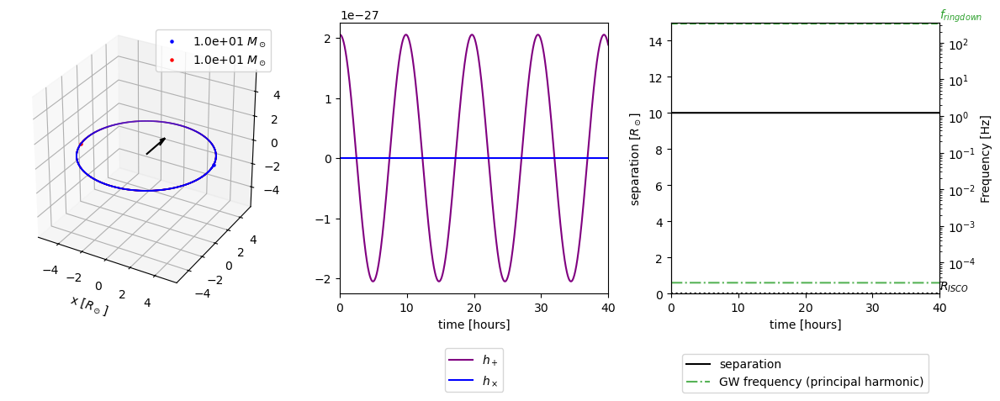

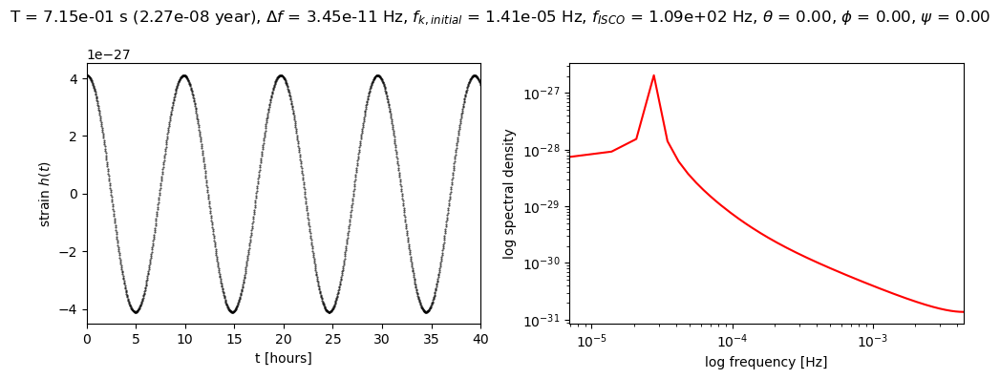

In [23]:
plot(A,tstop=40*hour) 
signal_in_detector(A,t_obs=40*hour,pbar=False,plot=True,tstop=40*hour);
animation(A,tstart=0,tstop=40*hour,deltaT=1*hour) 

In [20]:
B = Binary(M1=10,M2=10,a=1*R_sun,e=0.6,d=1.e9,i=np.pi/2,peri_arg=0,sky_loc=[0,0,0]) 

r_periastron (minimum separation): 0.40 R_sun
r_apoastron (maximum separation): 1.60 R_sun
Orbital period: 2239.16 s
f kepler: 4.47e-04 Hz
R ISCO: 2.56e-04 R_sun
f ISCO: 1.09e+02 Hz
Chirp mass: 8.71 M_sun
Eccentricity factor F_e: 5.30e+01
Coalescence time: 1.97e+07 periods: 1.40e+03 years (4.42e+10 s)


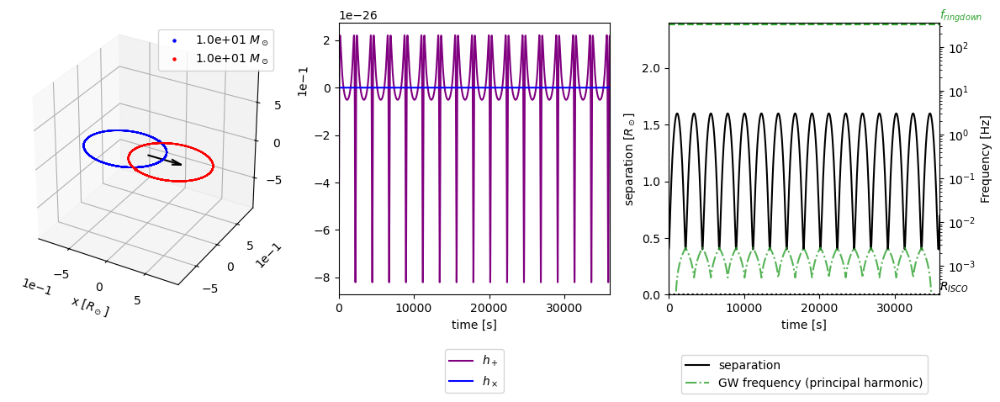

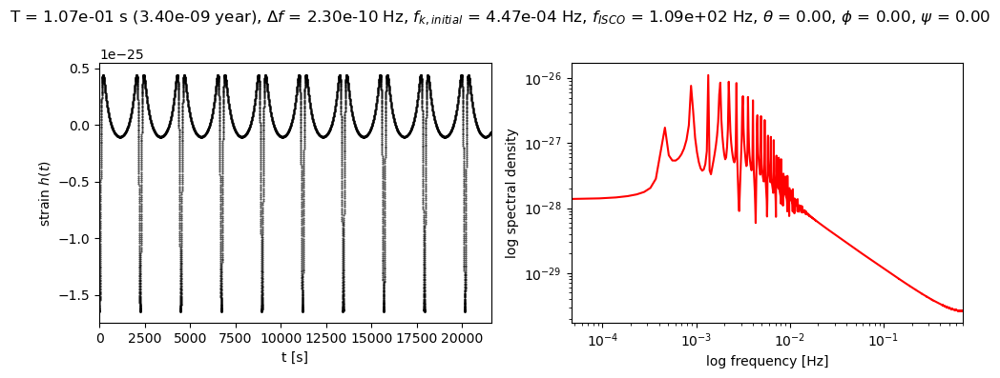

In [24]:
plot(B,tstop=10*hour) 
signal_in_detector(B,t_obs=6*hour,plot=True,tstart=0,tstop=6*hour);
animation(B,tstart=0*hour,tstop=1*hour,deltaT=0.05*hour) 

r_periastron (minimum separation): 400.00 R_sun
r_apoastron (maximum separation): 1600.00 R_sun
Orbital period: 0.12 s
f kepler: 8.20e+00 Hz
R ISCO: 1.78e+02 R_sun
f ISCO: 1.09e+02 Hz
Chirp mass: 8.71 M_sun
Eccentricity factor F_e: 5.30e+01
Coalescence time: 1.54e+00 periods: 5.97e-09 years (1.88e-01 s)


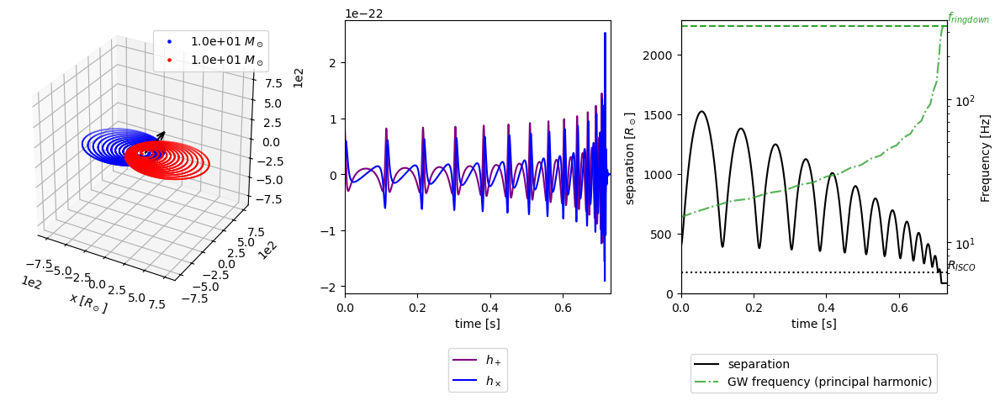

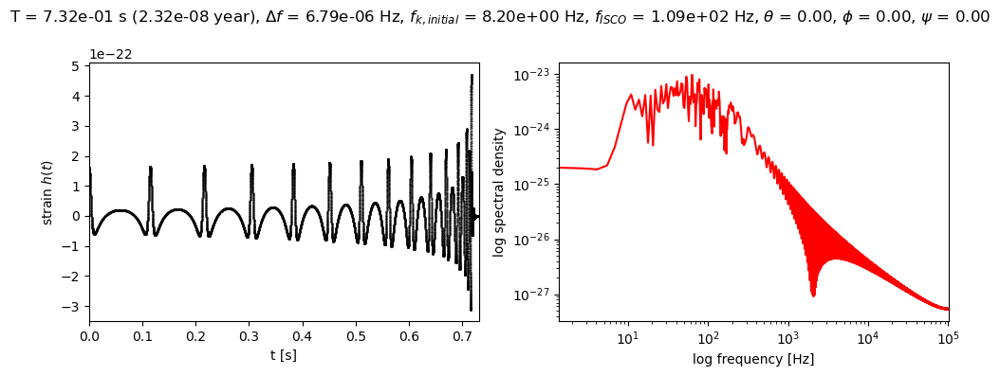

In [114]:
C = Binary(M1=10,M2=10,a=1.e3*km,e=0.6,d=1.e9,i=np.pi/5,peri_arg=0,sky_loc=[0,0,0])
plot(C,tstop=6*C.P) 
signal_in_detector(C,t_obs=6*C.P,plot=True,tstart=0,tstop=6*C.P);
animation(C,tstart=0*C.P,tstop=6*C.P,deltaT=0.1*C.P) 

r_periastron (minimum separation): 2.33 AU
r_apoastron (maximum separation): 44.20 AU
Orbital period: 40.98 days
f kepler: 2.82e-07 Hz
R ISCO: 5.95e-02 AU
f ISCO: 2.18e-03 Hz
Chirp mass: 1000.00 M_sun
Eccentricity factor F_e: 1.18e+04
Coalescence time: 7.04e+06 periods: 7.89e+05 years (2.49e+13 s)


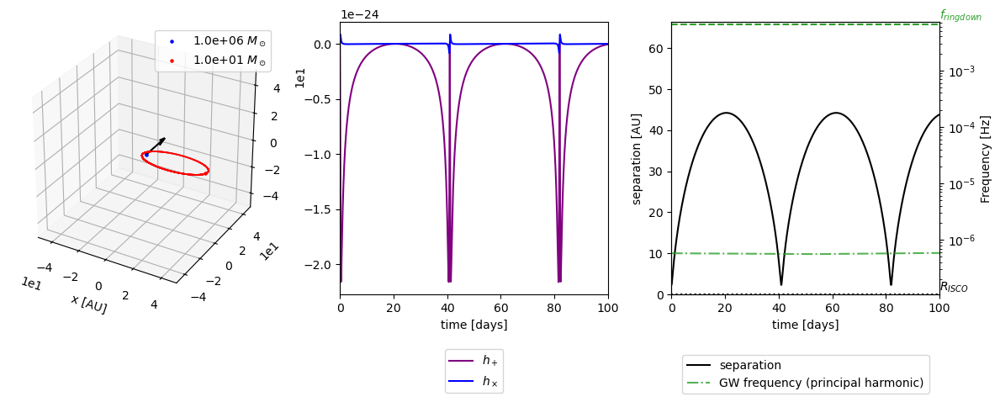

In [29]:
C = Binary(M1=1.e6,M2=10,a=5.e3*R_sun,e=0.9,d=1.e9,i=np.pi/2-0.01,peri_arg=np.pi/2,sky_loc=[0,0,0])
plot(C,tstop=100*day) 
#signal_in_detector(D,t_obs=6*D.P,plot=True,tstart=0,tstop=6*D.P);
#animation(D,tstart=0*D.P,tstop=6*D.P,deltaT=0.1*D.P) 

r_periastron (minimum separation): 2.33 AU
r_apoastron (maximum separation): 44.20 AU
Orbital period: 40.98 days
f kepler: 2.82e-07 Hz
R ISCO: 5.95e-02 AU
f ISCO: 2.18e-03 Hz
Chirp mass: 1000.00 M_sun
Eccentricity factor F_e: 1.18e+04
Coalescence time: 7.04e+06 periods: 7.89e+05 years (2.49e+13 s)


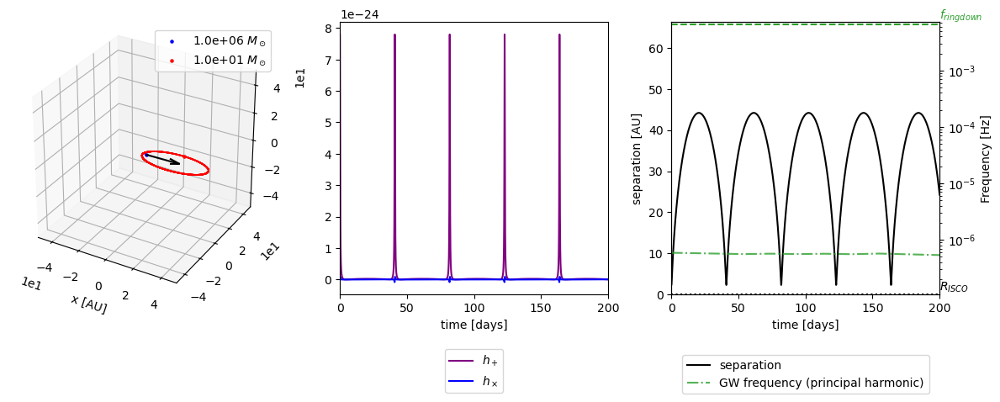

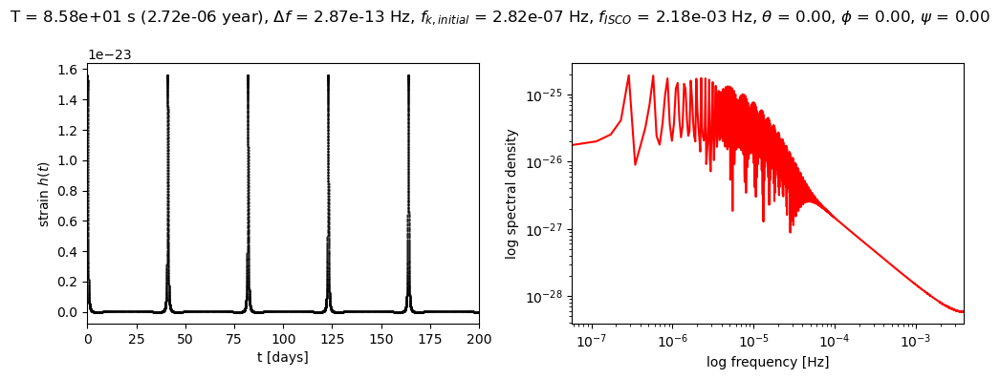

In [28]:
D = Binary(M1=1.e6,M2=10,a=5.e3*R_sun,e=0.9,d=1.e9,i=np.pi/2-0.01,peri_arg=0,sky_loc=[0,0,0])
plot(D,tstop=200*day) 
signal_in_detector(D,t_obs=200*day,plot=True,tstart=0,tstop=200*day);
#animation(D,tstart=0*D.P,tstop=50*day,deltaT=1*day) 

**PART 2: CHARACTERISTIC STRAINS, DETECTORS RESPONSE**

In [139]:
### LIGO, VIRGO, PTA sensitivity curves ###

# Define frequency ranges for each detector
f_ligo = np.logspace(1, 3, 1000)  # 10 Hz to 1000 Hz
f_lisa = np.logspace(-4, 0, 1000)  # 0.0001 Hz to 1 Hz
f_pta = np.logspace(-9, -7, 1000)  # 1e-9 Hz to 1e-7 Hz


# Define sensitivity curves for each detector (CHARACTERISTIC NOISE STRAIN)
def ligo_sensitivity(f):
    f0 = 215  
    S0 = 1e-23
    return S0 * ( (f / f0)**(-4.14) + (f / f0)**2 )

def lisa_sensitivity(f):
    f0 = 1e-3  
    S0 = 1e-20
    return S0 * ( (f / f0)**(-4) + 1 + (f / f0)**2 )

def pta_sensitivity(f):
    f0 = 1e-8  
    S0 = 1e-14
    return S0 * ( (f / f0)**(-4/3) + (f / f0)**(2/3) )

def h_n(f):
    if 10 <= f <= 1000:  # LIGO frequency range
        return ligo_sensitivity(f)
    elif 1e-4 <= f <= 1:  # LISA frequency range
        return lisa_sensitivity(f)
    elif 1e-9 <= f <= 1e-7:  # PTA frequency range
        return pta_sensitivity(f)
    else:
        return 0




In [79]:

def SNR(frequencies,h_c,h_n,f_min,f_max):

    h_c_fun = interp1d(frequencies, h_c, kind='linear', fill_value="extrapolate")
    result, error = quad(lambda f: 1/f * h_c_fun(f)**2 / h_n(f)**2,f_min,f_max)

    return np.sqrt(result)
    

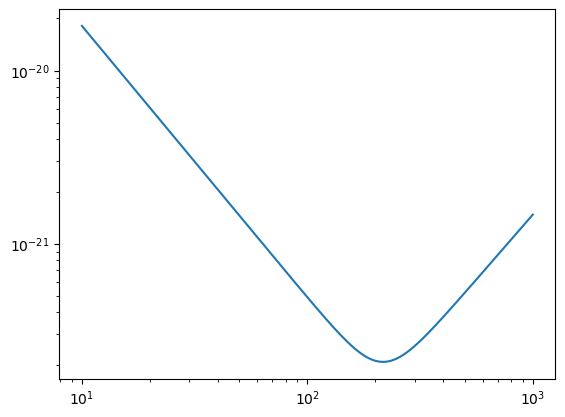

In [140]:
plt.plot(f_ligo,ligo_characteristic_strain(f_ligo))
plt.xscale("log")
plt.yscale("log")

In [141]:

# Update the plot with new data 
def add_to_big_plot(binary, system_array, T,pbar=False,plot=False,tstart=0,tstop=0):
        
    h, t, h_f, frequencies = signal_in_detector(binary, T, pbar, plot, tstart, tstop) #all in i.u.

    #convert time and frequencies from iu to Hz
    T = T/s_IU
    t = t/s_IU
    frequencies = frequencies*s_IU
    
    frequency_resolution = 1/T
    
    freq_times, freq = extract_frequencies(t,h)
    f_of_t = interp1d(freq_times, freq, kind='linear', fill_value="extrapolate") 
    df_dt = derivative(f_of_t, freq_times, dx=1e-6)
    freq = f_of_t(freq_times)
    dt_df = interp1d(freq, 1/df_dt, kind='linear', fill_value="extrapolate") 
    dt_dlnf = freq * dt_df(freq)   
    dt_dlnf = np.where(np.isinf(dt_dlnf), np.nan, dt_dlnf)

    print("Observing time is: %.2e s" %T)
    print("Time spent in log freq bin is: %.2e s" %np.nanmax(dt_dlnf))
    print("delta f is %.2e Hz" %(max(freq)-min(freq)))
    print("frequency resolution is %.2e Hz:" %frequency_resolution)
 
    
    if np.nanmax(dt_dlnf) < T:
        print("Chirping source")
        h_c = 2 * frequencies * h_f 
        f = frequencies #[np.argmax(h_c):]
        #h_c = h_c[np.argmax(h_c):]
        h_c_fun = interp1d(f, h_c, kind='linear', fill_value="extrapolate")
        snr = quad(lambda f_val: 1/f_val * h_c_fun(f_val)**2 / h_n(f_val)**2,f[0],f[-1])[0]   #f_min,f_max

        
    elif max(freq)-min(freq) > frequency_resolution:    
        print("Drifting source")
        h_c = 2 * frequencies * h_f
        f = frequencies
        h_c_fun = interp1d(f, h_c, kind='linear', fill_value="extrapolate")
        snr = quad(lambda f_val: 1/f_val * h_c_fun(f_val)**2 / h_n(f_val)**2,f[0],f[-1])[0]   #f_min,f_max
    
    else:
        print("Monochromatic source")
        f = frequencies[np.argmax(h_f)]
        n_cycles = T * f
        h_c = max(h_f) * np.sqrt(n_cycles)
        snr = h_c/h_n(f)

    system = [binary,f,h_c,T,snr]
    system_array.append(system)


# Update the plot with new data 
def remove_from_big_plot(k_arr,system_array):
    for k in k_arr:
        del system_array[k]
    

In [142]:
def show_big_plot(system_array,T):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12), height_ratios=[2.5, 1])
    fig.suptitle("Sensitivity Curves of LIGO-VIRGO, LISA, and PTA, T = %.2f years" %(T/yr_IU), fontsize=14)
    
    # Set common attributes for both axes
    for ax in [ax1, ax2]:
        ax.set_xlim(1.e-9, 1.e4)
        ax.set_xscale("log")
        ax.grid(True, which="both", ls="--", lw=0.5)

    # Set specific attributes for ax1 and ax2
    ax1.set(yscale="log", ylim=(1.e-23, 1.e-12), ylabel="log spectral density")
    ax2.set(yscale="log", ylim=(1., 1.e10), xlabel="log frequency [Hz]", ylabel="log Chirp Mass")

    # Plot the fixed sensitivity curves
    ax1.plot(f_ligo, ligo_sensitivity(f_ligo), c='black', linewidth=3, linestyle=':')
    ax1.plot(f_ligo, ligo_characteristic_strain(f_ligo), c='black', linewidth=3, linestyle='-')
    ax1.plot(f_lisa, lisa_sensitivity(f_lisa), c='black', linewidth=3, linestyle='-.')
    ax1.plot(f_pta, pta_sensitivity(f_pta), c='black', linewidth=3, linestyle='--')

    freq = np.logspace(-9,4)
    M_f_isco = 4*1.e3 / freq
    M_f_ringdown = 3*M_f_isco
    M_f_crit = 10 * (freq**-1 * 3.e-2 * (T/(10*yr_IU))**-(3/2))**(8/5)
    M_f_mono = 1.e3*(freq**-1 * 3.e-7 * (T/(10*yr_IU))**-(6/11))**(11/5)
    ax2.plot(freq, M_f_isco,c='red',linestyle=':')
    ax2.plot(freq, M_f_ringdown,c='red',linestyle='-.')
    ax2.plot(freq,M_f_crit,c='blue',linestyle=':')
    ax2.plot(freq,M_f_mono,c='green',linestyle=':')

    for system in system_array:
        
        binary,f,h_c,T,snr = system[0], system[1], system[2], system[3], system[4]

        source_string = (
            r"T = %.2e s.  SNR = %.2e" "\n"
            r"$M_1 = $ %.1e $M_\odot$, $M_2 = $ %.1e $M_\odot$" "\n"
            r"a = %.1e %s, e = %.2f" "\n"
            r"f_isco = %.1e Hz, $t_c = $ %.1e years (%.1e s)" "\n"
            r"$d = $ %.e parsec"
            % (T / s_IU, snr, binary.M1, binary.M2, binary.a / binary.d_factor, binary.d_units, binary.e,
               binary.f_isco * s_IU, binary.t_c / yr_IU, binary.t_c / s_IU, binary.d / parsec_IU)
        )

        ax1.plot(f, h_c, label=source_string)

        ax2.scatter(f, binary.M_chirp*np.full(len(f),1), label=source_string)

    ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True,
               ncol=3, fontsize='small', frameon=True, handlelength=2, borderpad=1.5, labelspacing=1.5)

    plt.tight_layout()
    plt.show()



In [143]:
a=np.array([1,2,3,4])
print(a[2:])

[3 4]


In [144]:
system_array = []

In [145]:
T = 1*yr_IU #6.28 i.u.

r_periastron (minimum separation): 400.00 km
r_apoastron (maximum separation): 400.00 km
Orbital period: 6.14e-09 (0.03 s)
R ISCO: 1.78e+02 km
f ISCO: 1.09e+02 Hz
Chirp mass: 8.71 M_sun
Eccentricity factor F_e: 1.00e+00
Coalescence time: 5.09e-08 periods: 8.10e-09 years (2.56e-01 s)
Merger after: 1.15e-01 s (3.64e-09 yrs)


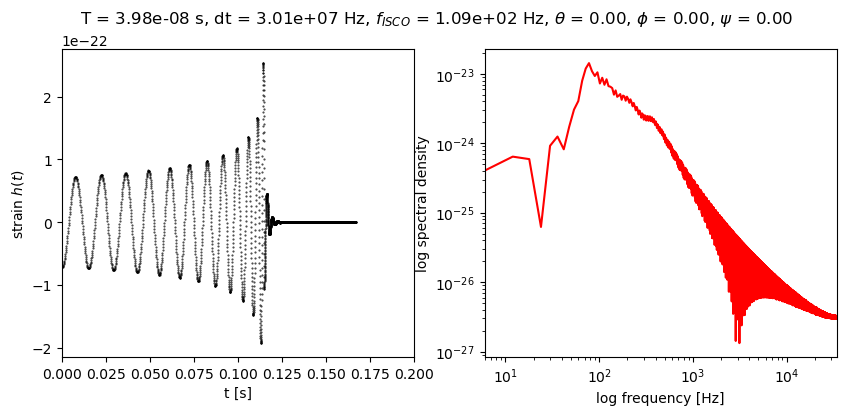

Observing time is: 3.16e+07 s
Time spent in log freq bin is: 2.32e-01 s
delta f is 4.38e+02 Hz
frequency resolution is 3.17e-08 Hz:
Chirping source


In [146]:
#drifting black hole binary at 1 Gpc
merging_SBHB = Binary(M1=10,M2=10,a=400*km_IU,e=0.0,d=1.e9,i=np.pi/2,peri_arg=0,sky_loc=[0,0,0]) 
add_to_big_plot(merging_SBHB,system_array,T,plot=True,tstart=0,tstop=2e-1*s_IU)
#plot(merging_SBHB,T)

In [119]:
#drift SBHB at 1 kpc
drift_SBHB = Binary(M1=200,M2=200,a=3*R_sun_IU,e=0.0,d=1.e3,i=0,peri_arg=0,sky_loc=[0.5,0.3,0.4]) 

r_periastron (minimum separation): 3.00 [$R_\odot$]
r_apoastron (maximum separation): 3.00 [$R_\odot$]
Orbital period: 5.18e-04 (2601.66 s)
R ISCO: 5.12e-03 [$R_\odot$]
f ISCO: 5.45e+00 Hz
Chirp mass: 174.11 M_sun
Eccentricity factor F_e: 1.00e+00
Coalescence time: 4.72e+03 periods: 7.51e+02 years (2.37e+10 s)


In [120]:
#chirping SMBHB at 1 Gpc
chirp_SMBHB = Binary(M1=1.e6,M2=1.e6,a=1.e2*R_sun_IU,e=0.0,d=1.e9,i=0,peri_arg=0,sky_loc=[0.5,0.3,0.4]) 

r_periastron (minimum separation): 0.47 [AU]
r_apoastron (maximum separation): 0.47 [AU]
Orbital period: 1.41e-03 (1.97 hours)
R ISCO: 1.19e-01 [AU]
f ISCO: 1.09e-03 Hz
Chirp mass: 870550.56 M_sun
Eccentricity factor F_e: 1.00e+00
Coalescence time: 4.66e-02 periods: 7.42e-03 years (2.34e+05 s)


Merger after: 1.04e+05 s (3.31e-03 yrs)


Evolution Progress:   3%| | 0.18727374863161453/6.283695522616366 [04:37<2:30:20


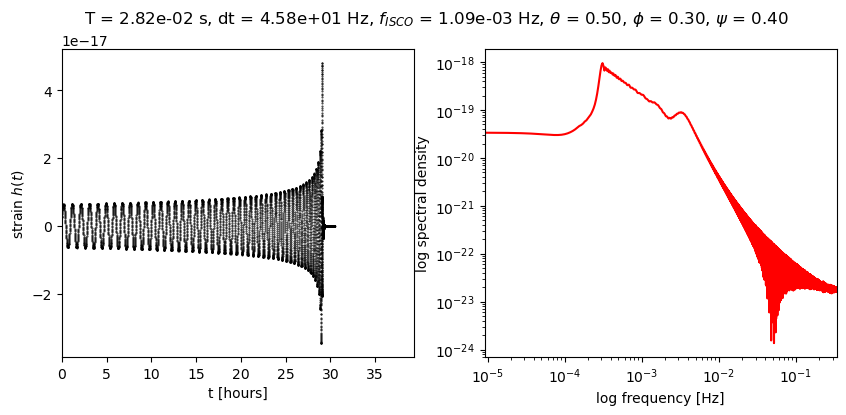

Observing time is: 3.16e+07 s
Time spent in log freq bin is: 3.92e+05 s
delta f is 3.56e-03 Hz
frequency resolution is 3.17e-08 Hz:
Chirping source


In [121]:
add_to_big_plot(chirp_SMBHB,system_array,T, pbar=False,plot=True,tstart=0,tstop=20*chirp_SMBHB.P)

In [29]:
add_to_big_plot(drift_SBHB,system_array,T, pbar=True,plot=False,tstart=0,tstop=T)

Evolution Progress: 100%|▉| 6.283665203490338/6.283695522616366 [15:39<00:00, 14


Observing time is: 3.16e+07 s
Time spent in log freq bin is: 5.96e+05 s
delta f is 2.68e-04 Hz
frequency resolution is 3.17e-08 Hz:
Chirping source


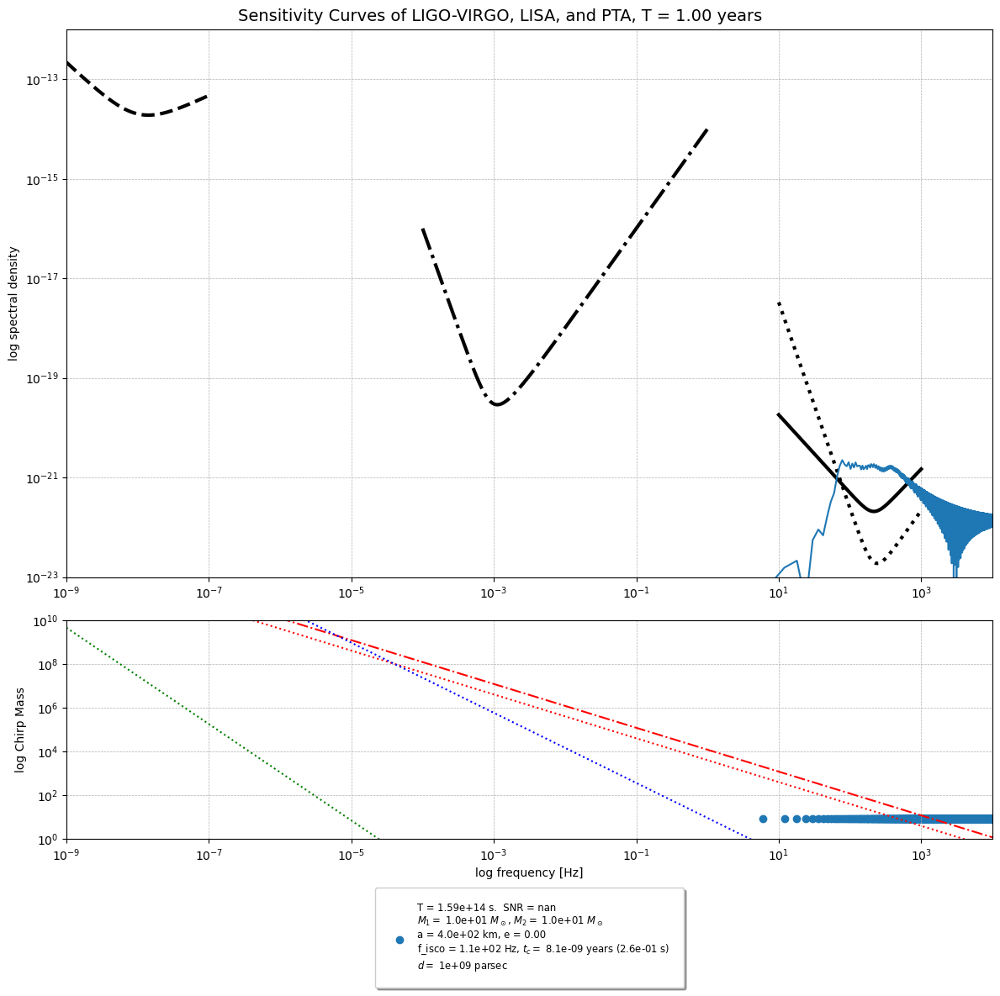

In [147]:
show_big_plot(system_array,T=1*yr_IU)


r_periastron (minimum separation) is: 0.33 AU
r_apoastron (maximum separation) is: 0.33 AU
Orbital period is 8.26e-04 (1.15 hours)
R ISCO is 1e-01 AU
f ISCO is 1e-03 Hz
Chirp mass is: 870550.56 M_sun
Eccentricity factor F_e is: 1.00e+00
Coalescence time is 1.36e+01 periods: 1.78e-03 years (5.62e+04 s)


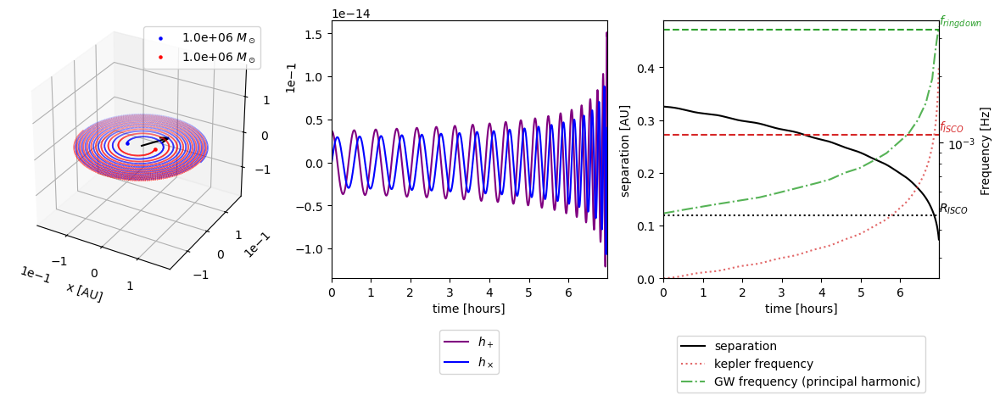

Drifting source


/tmp/ipykernel_113353/4237907357.py:17: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  df_dt = derivative(f_of_t, freq_times, dx=1e-6)
/tmp/ipykernel_113353/1308594429.py:4: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  result, error = quad(lambda f: 1/f * h_c_fun(f)**2 / h_n(f)**2,f_min,f_max)


In [132]:
b3 = Binary(M1=1.e6,M2=1.e6,a=70*R_sun_IU,e=0.0,d=1.e6,i=np.pi/3,argument_of_periastron=0) 
plot(b3,tstop=10*5.e-4)
add_to_big_plot(b3,[0,0,0],10*5.e-4,system_array)

In [133]:
b4 = Binary(M1=1.e9,M2=1.e9,a=1.e-2*parsec_IU,e=0.0,d=1.e9,i=0,argument_of_periastron=0) 
add_to_big_plot(b4,[0,0,0],10*b4.P,system_array)

r_periastron (minimum separation) is: 2062.83 AU
r_apoastron (maximum separation) is: 2062.83 AU
Orbital period is 1.32e+01 (2.09 years)
R ISCO is 1e+02 AU
f ISCO is 1e-06 Hz
Chirp mass is: 870550563.30 M_sun
Eccentricity factor F_e is: 1.00e+00
Coalescence time is 1.37e+03 periods: 2.87e+03 years (9.05e+10 s)
Monochromatic source


/tmp/ipykernel_113353/4237907357.py:17: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  df_dt = derivative(f_of_t, freq_times, dx=1e-6)
/tmp/ipykernel_113353/4237907357.py:19: RuntimeWarning: divide by zero encountered in divide
  dt_df = interp1d(freq, 1/df_dt, kind='linear', fill_value="extrapolate")
/tmp/ipykernel_113353/1308594429.py:4: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  

In [39]:
remove_from_big_plot([1],system_array)

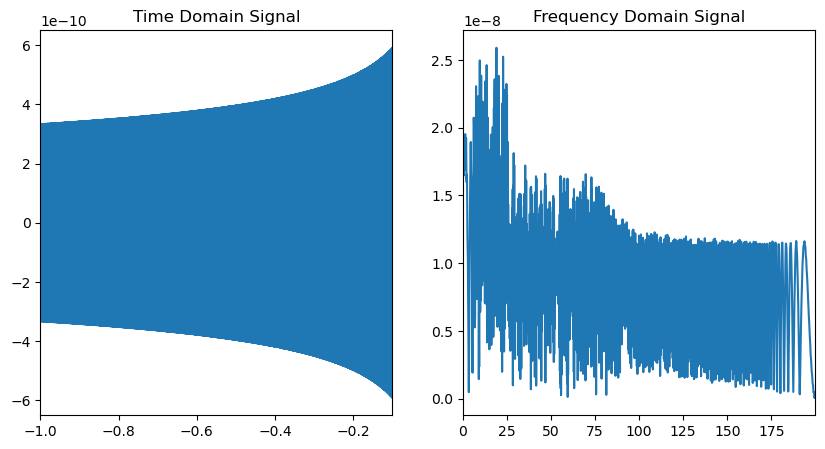

In [362]:
def merger_waveform(binary, t): 
    Omega = binary.Omega * (-t / (binary.t_c)) ** (-3/8)  # Updated to use binary.t_c directly
    f = Omega / (2 * np.pi)
    phase = -2 * ((binary.M_chirp)**(-5/8) * (-t)) ** (5/8)  # Assuming G, c, etc. are in binary
    A_gw = 2 * (binary.M_chirp)**(5/3) / (binary.d) * (np.pi * f) ** (2/3)
    
    h_plus = np.where(t < 0, A_gw * (1 + np.cos(binary.i) ** 2) * np.cos(f * t), 0)
    h_cross = np.where(t < 0, A_gw * (-2 * np.cos(binary.i)) * np.sin(f * t), 0)
    
    return h_plus, h_cross

def h_f(binary, tstart, tstop, sampling_rate):
    dt = 1 / sampling_rate
    t = np.arange(tstart, tstop, dt)
    
    # Generate h_plus over the entire time array
    h_plus, _ = merger_waveform(binary, t)
    
    # FFT of h_plus
    fft_h = np.fft.fft(h_plus)
    N = len(fft_h)
    
    frequencies = np.fft.fftfreq(N, dt)
    fft_magnitude = np.abs(fft_h)
    
    # Only return positive frequencies
    return frequencies[:N//2], fft_magnitude[:N//2]

# Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Time domain plot
t = np.linspace(-1, -0.1, 50000)
ax1.plot(t, merger_waveform(my_binary, t)[0])  # Only plotting h_plus here
ax1.set_xlim(min(t), max(t))
ax1.set_title('Time Domain Signal')

# Frequency domain plot
frequencies, fft_magnitude = h_f(my_binary, -10, -1, 400)
ax2.plot(frequencies, fft_magnitude)
ax2.set_xlim(0, max(frequencies))  # Only plot relevant positive frequencies
ax2.set_title('Frequency Domain Signal')

plt.show()

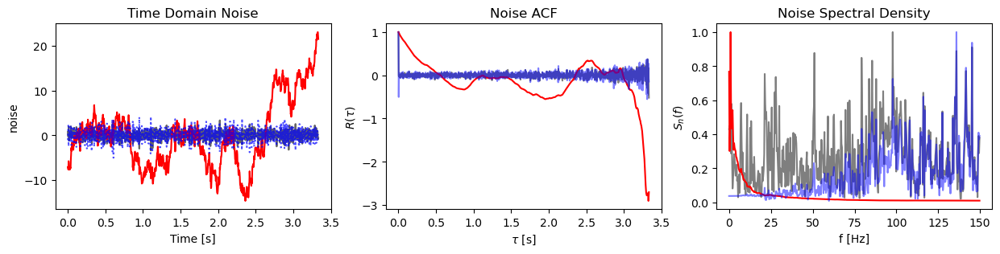

In [16]:
### NOISE POWER SPECTRAL DENSITY ###

sampling_rate = 300  # Sampling rate in Hz
dT = 1 / sampling_rate  # time between samples
N = 1000  # number of samples
T = N*dT # total integration time 

sigma = 1
t = np.linspace(0,T,N)
white_noise = np.random.normal(loc=0, scale=sigma, size=N)
red_noise = np.cumsum(white_noise)  # Cumulative sum of white noise to generate red noise
red_noise -= np.mean(red_noise) 
blue_noise = np.diff(white_noise, n=1)  # Differentiate white noise to emphasize high frequencies
blue_noise = np.append(blue_noise, blue_noise[-1])  # Match original length by appending the last value
blue_noise -= np.mean(blue_noise)


fft_white = np.fft.fft(white_noise) 
frequencies = np.fft.fftfreq(N, dT)[:N//2]  #Compute the corresponding (positive) frequencies
fft_white_magnitude = np.abs(fft_white)[:N//2]  # Take the magnitude (absolute value) of the FFT complex result
fft_red = np.fft.fft(red_noise) 
fft_red_magnitude = np.abs(fft_red)[:N//2]  
fft_blue = np.fft.fft(blue_noise) 
fft_blue_magnitude = np.abs(fft_blue)[:N//2]  

### ACF computed "by hand"
#n_interp = interp1d(t, red_noise, kind='linear', fill_value="extrapolate")
#def ACF(func,tau,T):
#    result, error = quad(lambda t: func(t)*func(t+tau), -T/2, T/2, limit=100, epsabs=1e-8, epsrel=1e-8) #args=(a,)
#    return (1/T)*result
#ACF_array = [] 
#for tau in t: 
#    ACF_array.append(ACF(n_interp,tau,T))

### Faster Autocorrelation using FFT ###
# Autocorrelation can be computed using the FFT convolution
acf_white = fftconvolve(white_noise, white_noise[::-1], mode='full')  # FFT-based convolution for ACF
acf_white = acf_white[N-1:] / np.arange(N, 0, -1)  # Normalize by the number of points
acf_red = fftconvolve(red_noise, red_noise[::-1], mode='full')  # FFT-based convolution for ACF
acf_red = acf_red[N-1:] / np.arange(N, 0, -1)  # Normalize by the number of points
acf_blue = fftconvolve(blue_noise, blue_noise[::-1], mode='full')  # FFT-based convolution for ACF
acf_blue = acf_blue[N-1:] / np.arange(N, 0, -1)  # Normalize by the number of points


fft_acf_white = np.fft.fft(acf_white) 
fft_acf_white_magnitude = np.abs(fft_acf_white)[:N//2]  
fft_acf_red = np.fft.fft(acf_red) 
fft_acf_red_magnitude = np.abs(fft_acf_red)[:N//2]  
fft_acf_blue = np.fft.fft(acf_blue) 
fft_acf_blue_magnitude = np.abs(fft_acf_blue)[:N//2]  



fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3), gridspec_kw={'width_ratios': [1, 1,1]})

ax1.plot(t, white_noise, c='black',alpha=0.6) 
ax1.plot(t, red_noise, c='red')
ax1.plot(t, blue_noise, c='blue', linestyle=':',alpha=0.7) 
ax1.set_title("Time Domain Noise")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("noise")

ax2.plot(t, np.array(acf_white)/max(acf_white), c='black',alpha=0.5) 
ax2.plot(t, np.array(acf_red)/max(acf_red), c='red') 
ax2.plot(t, np.array(acf_blue)/max(acf_blue), c='blue',alpha=0.5) 
ax2.set_title("Noise ACF")
ax2.set_xlabel("$\\tau$ [s]")
ax2.set_ylabel("$R(\\tau)$")

#ax3.plot(frequencies, 2*fft_white_magnitude/max(fft_white_magnitude)/T)
ax3.plot(frequencies, np.array(fft_acf_white_magnitude)/max(fft_acf_white_magnitude),c='black',alpha=0.5)
ax3.plot(frequencies, np.array(fft_acf_red_magnitude)/max(fft_acf_red_magnitude),c='red')
ax3.plot(frequencies, np.array(fft_acf_blue_magnitude)/max(fft_acf_blue_magnitude),c='blue',alpha=0.5)
ax3.set_title("Noise Spectral Density")
ax3.set_xlabel("f [Hz]")
ax3.set_ylabel("$S_n(f)$")

plt.show()

h_0 is 1.000000
n0/rad(N) is 0.632456


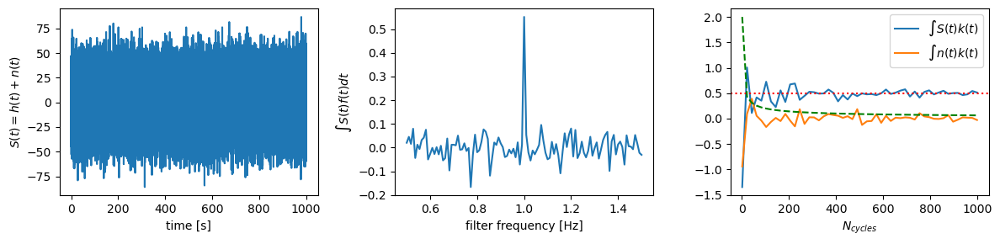

In [39]:
### MATCH FILTERING ###

A_signal = 10
freq_signal = 1
P_signal = 1 / freq_signal
sigma_noise = 20

# Signal function
def h(t):
    return A_signal * np.sin(2 * np.pi * freq_signal * t)

# Generate time-dependent white noise
def n(t):
    return np.random.normal(0, sigma_noise, size=t.shape)

# Noisy signal
def S(t):
    return h(t) + n(t)

# Matched filter
def filter(t, A_filter, freq_filter):
    return A_filter * np.sin(2 * np.pi * freq_filter * t)

# Parameters
T = 1000 * P_signal
dt = 0.01 * P_signal  # Time step

freq_filter = np.linspace(0.5, 1.5, 111)
integral_match_filter = []

t = np.arange(0, T, dt)
for f in freq_filter:
    integral_match_filter.append(np.sum(S(t) * filter(t,A_signal,f)) * dt / T)  #quad not working

h0 = A_signal
n0 = sigma_noise
n_cycles = T/P_signal
print("h_0 is %f" %h0)
print("n0/rad(N) is %f" %(n0/np.sqrt(n_cycles)))


# Parameters
T_array = np.linspace(P_signal,1000*P_signal)
dt = 0.01 * P_signal 
integral_noise = []
integral_signal = []

for i in range(len(T_array)):
    t = np.arange(0, T_array[i], dt)
    integral_noise.append(np.sum(n(t) * filter(t,A_signal,freq_signal)) * dt / T_array[i])
    integral_signal.append(np.sum(S(t) * filter(t,A_signal,freq_signal)) * dt / T_array[i])



fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 3), gridspec_kw={'width_ratios': [1, 1,1]})

t = np.arange(0,T,dt)
ax1.plot(t,S(t))
ax1.set_xlabel("time [s]")
ax1.set_ylabel("$S(t)=h(t)+n(t)$")

ax2.plot(freq_filter,integral_match_filter)
ax2.set_xlabel("filter frequency [Hz]")
ax2.set_ylabel("$\int S(t)f(t)dt$")

N_cycles = T_array/P_signal
ax3.plot(N_cycles,integral_signal,label="$\\int S(t)k(t)$")
ax3.axhline(y = h0**2/2, c = 'red', linestyle = ':')
ax3.plot(N_cycles,integral_noise,label="$\\int n(t)k(t)$")
ax3.plot(N_cycles,h0*n0/np.sqrt(T_array/dt), c = 'green', linestyle = '--')
#ax3.set_xlim(100,1000)
ax3.set_xlabel("$N_{cycles}$")
#ax3.set_ylabel("$\int S(t)f(t)dt$")
ax3.legend()

plt.tight_layout()
plt.show()


In [50]:
### Wiener filter ###

## returns complex wiener function of f (defined from -inf to +inf)

def Wiener_filter(h,params,Sn,sampling_rate,T): 

    dT = 1 / sampling_rate  
    N = int(T/dT)

    t = np.linspace(0,T,N)
    signal = h(t,params)

    fft_signal = np.fft.fft(signal) 
    frequencies = np.fft.fftfreq(N, dT) 
    
    fft_signal_func = interp1d(frequencies, fft_signal, kind='linear', fill_value="extrapolate")
    
    def wiener_filter(f):
        return fft_signal_func(f) / Sn(f)  
    
    return wiener_filter
#####



def SNR(h_filter, params, Sn, sampling_rate, T):

    dT = 1 / sampling_rate  
    N = int(T/dT)
    t = np.linspace(0, T, N)
    h_signal = h_filter(t, params)

    """
    This 
    """
    
    # Compute FFT
    fft_signal = np.fft.fft(h_signal) 
    frequencies = np.fft.fftfreq(N, dT)

    # Only take the positive frequencies and corresponding FFT values
    positive_freqs = frequencies[:N // 2]  
    fft_signal_positive = fft_signal[:N // 2]  
    
    # Interpolate FFT values
    fft_signal_func = interp1d(positive_freqs, fft_signal_positive, kind='linear', fill_value="extrapolate")

    # Get the Wiener filter function
    wiener_filter = Wiener_filter(h_filter, params, Sn, sampling_rate, T)

    # Calculate the expected value of the signal (S_exp_value)
    S_exp_value = quad(
        lambda f: fft_signal_func(f) * np.conjugate(wiener_filter(f)), 
        0, np.max(positive_freqs)  # Limit integration to positive frequencies
    )[0]

    # Calculate the expected value of the noise (N_exp_value)
    N_exp_value = np.sqrt(
        quad(
            lambda f: 1/2 * Sn(f) * (wiener_filter(f) * np.conjugate(wiener_filter(f))), 
            0, np.max(positive_freqs)  # Limit integration to positive frequencies
        )[0]
    )
    
    # Return the SNR
    return np.abs(S_exp_value) / N_exp_value


def SNR_white(h_filter, params, Sn, sampling_rate, T):

    dT = 1 / sampling_rate  
    N = int(T/dT)
    t = np.linspace(0, T, N)
    h_signal = h_filter(t, params)
    
    # Compute FFT
    fft_signal = np.fft.fft(h_signal) 
    frequencies = np.fft.fftfreq(N, dT)  # Full frequency range
    positive_freqs = frequencies[:N // 2]  # Only positive frequencies
    fft_signal_positive = fft_signal[:N // 2]  # Only positive frequencies

    # Interpolate on the complex FFT values, not just magnitudes, because the SNR calculation needs the phase information as well.
    fft_signal_func = interp1d(positive_freqs, fft_signal_positive, kind='linear', fill_value="extrapolate")

    # Calculate the SNR
    SNR_squared = 4 * quad(
        lambda f: np.abs(fft_signal_func(f)**2) / Sn(f),
        0, np.max(positive_freqs)  # Only integrate over the range of available frequencies
    )[0]
    
    return np.sqrt(SNR_squared)

    
    ####
    #result, error = quad(lambda freq: fft_signal_func(freq)/Sn(freq), 0, np.infty, limit=50, epsabs=1e-8, epsrel=1e-8)
    #SNR = 2*np.sqrt(result)
    
    #return SNR

In [52]:
A_signal = 1.e-23
freq_signal = 1.e-2
phi_0_signal = np.pi
P_signal = 1 / freq_signal

# Signal function
def h(t,params):
    return A_signal * np.sin(2 * np.pi * freq_signal * t + phi_0_signal)
def Sn(f):
    return 1.e-42

#params = [1,1]
sampling_rate = 1
T = 1.e5
params = 0

print(SNR(h, params, Sn, sampling_rate, T))
print(SNR_white(h, params, Sn, sampling_rate, T))

#f = np.linspace(0,100)
#Wiener_filter(h,params,Sn,sampling_rate,T)

#print(Wiener_filter(h,params,Sn,sampling_rate,T)(f))
#print(Wiener_filter(h,params,Sn,sampling_rate,T)(f).conjugate())

/tmp/ipykernel_30954/1971079318.py:81: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  S_exp_value = quad(


0.023590659132287334
2.5819714331515624


/tmp/ipykernel_30954/1971079318.py:115: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  SNR_squared = 4 * quad(


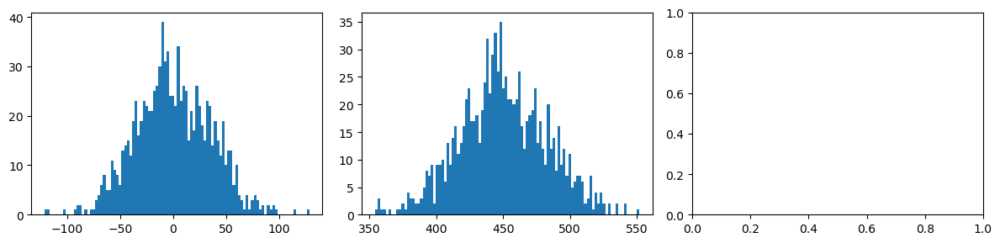

In [15]:
### DETECTION STATISTICS ###

A_signal = 30
freq_signal = 1
P = 1 / freq_signal

B = 100
sigma = 0.5

# Signal function
def h(t):
    return A_signal * np.sin(2 * np.pi * freq_signal * t)

# Generate time-dependent noise
def n(t):
    return B * np.random.normal(0, sigma, size=t.shape)

# Noisy signal
def S(t):
    return h(t) + n(t)

# Matched filter
def filter(t, A, freq):
    return A * np.sin(2 * np.pi * freq * t)

# Parameters
T = 10 * P
dt = 0.01 * P  # Time step
freq_filter = 1

integral_no_signal = []
integral_signal = []
t = np.arange(0, T, dt)
for _ in range(1000):
    integral_no_signal.append(np.sum(n(t) * filter(t,A_signal,freq_filter)) * dt / T)
    integral_signal.append(np.sum(S(t) * filter(t,A_signal,freq_filter)) * dt / T)

#quad(lambda t: 1/T[i] * S(t)*h(t), 0, T[i])[0]
#quad not working

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 3), gridspec_kw={'width_ratios': [1, 1,1]})

ax1.hist(integral_no_signal,100)
ax2.hist(integral_signal,100)
#ax1.set_xlabel("time [s]")
#ax1.set_ylabel("S(t)=h(t)+n(t)")

#ax2.plot(freq_filter,integral)
#ax2.set_xlabel("filter frequency [Hz]")
#ax2.set_ylabel("$\int S(t)f(t)dt$")

#ax3.plot(T_array/P,integral_12)
#ax3.plot(T_array/P,integral_2)
#ax3.set_xlabel("cycles integrated")
#ax3.set_ylabel("$\int S(t)f(t)dt$")

plt.tight_layout()

In [ ]:

        #n_cycles
        #print(len(frequency_kepler))
        #print(len(t))
        #frequency_kepler = np.array(frequency_kepler)*s_IU
        #interp_func = interp1d(frequency_kepler, t, kind='linear', fill_value="extrapolate") 
        #dt_df = derivative(interp_func, frequencies, dx=1e-6)

        
        #n_cycles = dt_df*frequencies**2

        ## n cycles: the time spent in each frequency bin ##
        #frequency_kepler = 1/(2*np.pi) * np.sqrt(self.M/separation**3)*s_IU  #in Hz   #includes also ringdown      
        #dt_arr = np.diff(t)/s_IU
        #dt_arr = np.insert(dt_arr, 0, dt_arr[0])  # Prepend the first difference

        #bin_indices = np.digitize(frequency_kepler, frequencies) - 1  
        #bin_indices = np.clip(bin_indices, 0, len(frequencies) - 1)  # Clamp indices to valid range
                
        #dt_sums = np.zeros(len(frequencies))
        #for i, bin_index in enumerate(bin_indices):
        #    if bin_index >= 0 and bin_index < len(frequencies) - 1:  
        #        dt_sums[bin_index] += dt_arr[i]      

        #### n_cycles = dt_sums/df * frequencies**2
        #### n_cycles = dt_sums/t_obs
        #n_cycles = dt_sums * frequencies

        #print(frequencies)
        #print(frequency_kepler)
        #print(n_cycles)

In [ ]:
        #freq_times, frequencies = extract_frequencies(np.array(t), np.array(h_plus_arr))
        #f_of_t = interp1d(freq_times, frequencies, kind='linear', fill_value="extrapolate")  #plus,cross??

        #A_gw = 2*self.M_chirp**(5/3)/(c_IU**4*self.d)
    
        #phase_c_plus = np.arcsin(h_plus_arr[-1]/( (1+np.cos(self.i)**2) * A_gw * (np.pi*f_of_t(t[-1]))**(2/3)) )
        #phase_c_cross = np.arccos(h_cross_arr[-1]/( (-2*np.cos(self.i)) *A_gw * (np.pi*f_of_t(t[-1]))**(2/3)))
        
        #phase_plus = phase_c_plus #- self.argument_of_periastron
        #phase_cross = phase_c_cross #- self.argument_of_periastron

        #while t[-1] < tstop and f_of_t(t[-1]) < f_ringdown:    
            #phase += 2 * np.pi * f_of_t((t[-1] + t[-1] + dt) / 2) * dt
            #phase_plus += quad(lambda t_: 2*np.pi * f_of_t(t_),t[-1],t[-1]+dt)[0]
            #phase_cross += quad(lambda t_: 2*np.pi * f_of_t(t_),t[-1],t[-1]+dt)[0]
            #h_plus_arr.append((1+np.cos(self.i)**2)*A_gw*(np.pi*f_of_t(t[-1]))**(2/3)*np.cos(phase_plus))
            #h_cross_arr.append((-2*np.cos(self.i))*A_gw*(np.pi*f_of_t(t[-1]))**(2/3)*np.sin(phase_cross))
            #t.append(t[-1]+dt)
            #R1.append(R1[-1])
            #R2.append(R2[-1])
            #V1.append(V1[-1])
            #V2.append(V2[-1])
            #r.append(r[-1])

        #while t[-1] < tstop: 
    
            #phase_plus += 2*np.pi*f_ringdown*dt
            #h_plus_arr.append((1+np.cos(self.i)**2)*A_gw*(np.pi*f_ringdown)**(2/3) * np.exp(-2 * f_ringdown * t[-1] / Q) * np.cos(phase_plus))
            #h_cross_arr.append((-2*np.cos(self.i))*A_gw*(np.pi*f_ringdown)**(2/3) * np.exp(-2 * f_ringdown * t[-1] / Q) * np.sin(phase_plus))
            #R1.append(R1[-1])
            #R2.append(R2[-1])
            #V1.append(V1[-1])
            #V2.append(V2[-1])
            #r.append(r[-1])
            #t.append(t[-1]+dt)



#####

#other approach

        #f_of_t = instantaneous_freq(t,h_plus_arr)
        #phase_c = last_phase(t,h_plus_arr)
        #A = h_plus_arr[-1]/np.cos(phase_c)
        #dt = np.min(np.diff(t))




In [ ]:
def v_IU(M_cgs, r_cgs, v_cgs):
    return np.sqrt(r_cgs/(G*M_cgs))*v_cgs

def t_IU(M_cgs, r_cgs, t_cgs):
    return t_cgs/(np.sqrt(r_cgs/(G*M_cgs))*r_cgs)

#v_conversion = v_IU(M_sun,AU,26.22*10**5)
AU_IU = 1
parsec_IU = parsec/AU
R_sun_IU = R_sun/AU
km_IU = 1.e5/AU
yr_IU = t_IU(M_sun,AU,3.156*10**7)
day_IU = t_IU(M_sun,AU,86400)
hour_IU = t_IU(M_sun,AU,3600)
s_IU = t_IU(M_sun,AU,1)
c_IU = v_IU(M_sun,AU,c)
cm_s_IU = v_IU(M_sun,AU,1)


#print("26.22 km/s expressed in internal units is: %f" % v_conversion)
print("1 year expressed in internal units is: %f" % yr_IU)
print("1 s expressed in internal units is: %e" % s_IU)
print("c expressed in internal units is: %f" % c_IU)
print("1 cm/s expressed in internal units is: %e" % cm_s_IU)

In [ ]:


def instantaneous_freq(t,h):
    # Resample the time series data (t, h) to have equal timesteps
    dt = np.min(np.diff(t))  # smallest timestep in the original data
    t_uniform = np.arange(t[0], t[-1], dt) #_uniform
    h_interp = interp1d(t, h, kind='linear', fill_value="extrapolate")  
    h_resampled = h_interp(t_uniform)
    
    analytic_h = hilbert(h_resampled)
    amplitude_envelope = np.abs(analytic_h)
    #last_amplitude = amplitude_envelope[-1]
    instantaneous_phase = np.unwrap(np.angle(analytic_h))
    #last_phase = instantaneous_phase[-1]
            
    #Differentiate the phase to get the instantaneous frequency
    instantaneous_freq = np.diff(instantaneous_phase) / (2.0 * np.pi * dt)
    freq_interp = interp1d(t_uniform[:-1], instantaneous_freq, fill_value="extrapolate", kind='cubic')

    return freq_interp


def last_phase(t,h):
    analytic_h = hilbert(h)
    amplitude_envelope = np.abs(analytic_h)
    #last_amplitude = amplitude_envelope[-1]
    instantaneous_phase = np.unwrap(np.angle(analytic_h))
    return instantaneous_phase[-1]